## Path configuration

In [16]:
from pathlib import Path
import os

PROJECT_NAME = "MALDIAlign"

cwd = Path().resolve()

# Walk upwards until we find the project folder
target = None
for parent in [cwd] + list(cwd.parents):
    if parent.name == PROJECT_NAME:
        target = parent
        break

# If the project folder is found and we are not already there, then change cwd
if target is not None and target != cwd:
    os.chdir(target)

print("Working directory:", os.getcwd())

Working directory: /export/usuarios01/agnavarr/MALDIAlign


## Imports

In [17]:
import pickle
import numpy as np
import pandas as pd

# utils
from utils.config import load_config
from utils.data import load_pkl, map_domains
from utils.metrics import *
from utils.viz import *

# tools
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC

## Data loading

In [18]:
cfg = load_config()
driams_pkl = cfg["data"]["DRIAMS_REDUCED_PKL"]

In [19]:
driams = load_pkl(driams_pkl)

In [20]:
data, label, meta = driams["data"], driams["label"], driams["meta"]

In [21]:
# Apply normalization: scale each spectrum to [0, 1]
X_min = data.min(axis=1, keepdims=True)
X_max = data.max(axis=1, keepdims=True)
data_norm = (data - X_min) / (X_max - X_min + 1e-8)

In [22]:
meta = pd.DataFrame.from_records(list(meta))

In [23]:
# Filter the data by hospital
filtered_data = {}
for hosp in meta["hospital"].unique():
    idx = np.where(meta["hospital"].values == hosp)[0]
    filtered_data[hosp] = {
        "data": data_norm[idx],
        "label": label[idx],
        "meta": meta.iloc[idx]
    }

In [24]:
species, counts = np.unique(filtered_data["DRIAMS_A"]["label"], return_counts=True)
for sp, n in zip(species, counts):
    print(f"{sp}: {n}")

Enterobacter_cloacae_complex: 2573
Enterococcus_Faecium: 1800
Escherichia_Coli: 7381
Klebsiella_Pneumoniae: 4083
Pseudomonas_Aeruginosa: 4908
Staphylococcus_Aureus: 7065


In [25]:
# Declare the datasets
dataA, labelA, metaA = filtered_data["DRIAMS_A"]["data"], filtered_data["DRIAMS_A"]["label"], filtered_data["DRIAMS_A"]["meta"]
dataB, labelB, metaB = filtered_data["DRIAMS_B"]["data"], filtered_data["DRIAMS_B"]["label"], filtered_data["DRIAMS_B"]["meta"]
dataC, labelC, metaC = filtered_data["DRIAMS_C"]["data"], filtered_data["DRIAMS_C"]["label"], filtered_data["DRIAMS_C"]["meta"]
dataD, labelD, metaD = filtered_data["DRIAMS_D"]["data"], filtered_data["DRIAMS_D"]["label"], filtered_data["DRIAMS_D"]["meta"]

## After domain alignment (no downsampling, weighting species)

#### Utils

In [57]:
import torch
from models.deep.MultiVAE import MultiVAE_Bernoulli_Extended
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold

In [59]:
def load_model(model, path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.load_state_dict(torch.load(path, map_location=device))
    model.to(device)
    model.eval()
    return model

def encode_all_domains(vae, X, domain_ids, device, batch_size=256):
    vae.eval()
    mus = []
    with torch.no_grad():
        for i in range(0, len(X), batch_size):
            xb = torch.tensor(X[i:i+batch_size], dtype=torch.float32, device=device)
            d_id = torch.tensor(domain_ids[i:i+batch_size], dtype=torch.long, device=device)
            mu, _ = vae.encoder(xb)
            mus.append(mu.cpu())
    return torch.cat(mus).numpy()

def find_best_rf(Z_train, y_train_z):
    param_grid = {
        "n_estimators": [200, 400, 800],
        "max_depth": [None, 20, 40],
    }

    rf = RandomForestClassifier(
        class_weight="balanced_subsample",
        n_jobs=-1,
        random_state=42
    )

    grid = GridSearchCV(
        estimator=rf,
        param_grid=param_grid,
        scoring="balanced_accuracy",
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        n_jobs=-1,
        verbose=1,
        refit=True  
    )
    grid.fit(Z_train, y_train_z)

    print("Best params:", grid.best_params_)
    print("Best CV balanced_acc:", grid.best_score_)

    # Evaluar en test de D
    rf_best = grid.best_estimator_
    return rf_best

#### Load and train

In [85]:
multivae_weighted_path = "/export/usuarios01/agnavarr/MALDIAlign/experiments/results/vae_multidecoder_weighted/20251218_103014/model.pth"
backbone = MultiVAE_Bernoulli_Extended(dataA.shape[1], 64, 2)
multivae_weighted = load_model(backbone, multivae_weighted_path)

In [86]:
# Map each hospital to a domain ID 
meta_all = pd.concat([metaA, metaD], ignore_index=True)
data_all = np.vstack([dataA, dataD])
label_all = np.concatenate([labelA, labelD])
domain_ids = map_domains(meta_all) 

Z_all = encode_all_domains(multivae_weighted, data_all, domain_ids, device=device)
print("Latent space shape:", Z_all.shape)

# Get latent representations
Z_A = Z_all[domain_ids == 0]
Z_D = Z_all[domain_ids == 1]
print(f"Z_A: {Z_A.shape}, Z_D: {Z_D.shape}")

# Define train and test
Z_train, y_train_z = Z_A, labelA
Z_test, y_test_z = Z_D, labelD

Latent space shape: (35118, 64)
Z_A: (27810, 64), Z_D: (7308, 64)


In [87]:
# Find best RF
rf_best_weighted = find_best_rf(Z_train, y_train_z)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


Best params: {'max_depth': 20, 'n_estimators': 800}
Best CV balanced_acc: 0.9913952366245085


#### Test


===== Metrics =====
Domain: A (train) RF-latent (Weighted)
Balanced Accuracy: 0.9999
F1 Macro: 0.9999
Recall Macro: 0.9999
Specificity Macro: 1.0000



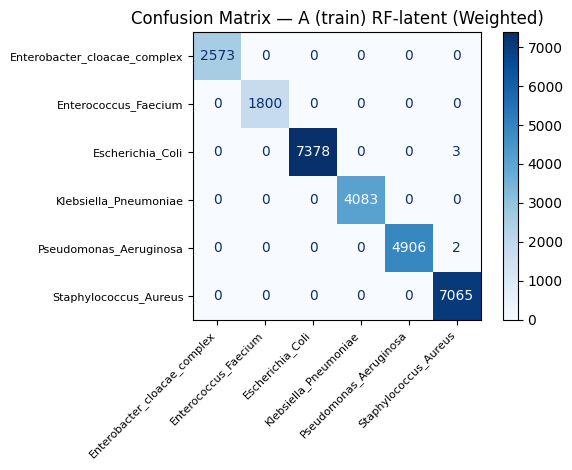


===== Metrics =====
Domain: D (test)  RF-latent (Weighted)
Balanced Accuracy: 0.8918
F1 Macro: 0.8171
Recall Macro: 0.8918
Specificity Macro: 0.9747



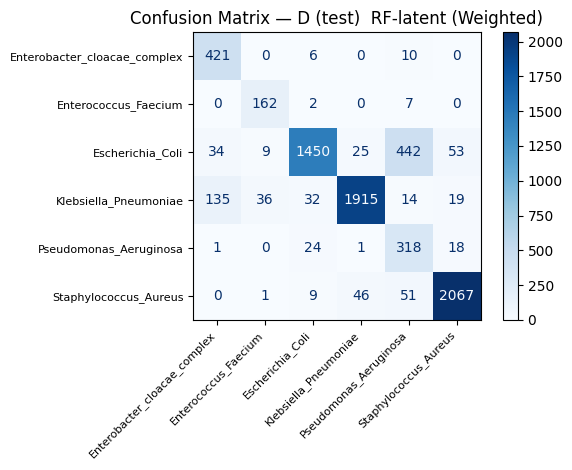

In [88]:
metrics_rf_train = metrics_report(Z_train, y_train_z, rf_best_weighted, "A (train) RF-latent (Weighted)")
metrics_rf_test  = metrics_report(Z_test,  y_test_z,  rf_best_weighted, "D (test)  RF-latent (Weighted)")
print_metrics(metrics_rf_train)
print_metrics(metrics_rf_test)

Find misclassified points

In [89]:
y_pred_A = rf_best_weighted.predict(Z_train)
y_pred_D = rf_best_weighted.predict(Z_test)

idx_A = np.where(y_pred_A != y_train_z)[0]
idx_D = np.where(y_pred_D != y_test_z)[0]

idx_A_global = np.where(meta_all["hospital"] == "DRIAMS_A")[0]
idx_D_global = np.where(meta_all["hospital"] == "DRIAMS_D")[0]

mis_idx_A_global = idx_A_global[idx_A]
mis_idx_D_global = idx_D_global[idx_D]

mis_idx_all_global = np.concatenate([
    mis_idx_A_global,
    mis_idx_D_global
])

#### t-SNE

In [90]:
tsne_multiweighted_df = compute_tsne_df(Z_all, label_all, meta_all)

##### Global


===== t-SNE: Global (colored by species) =====


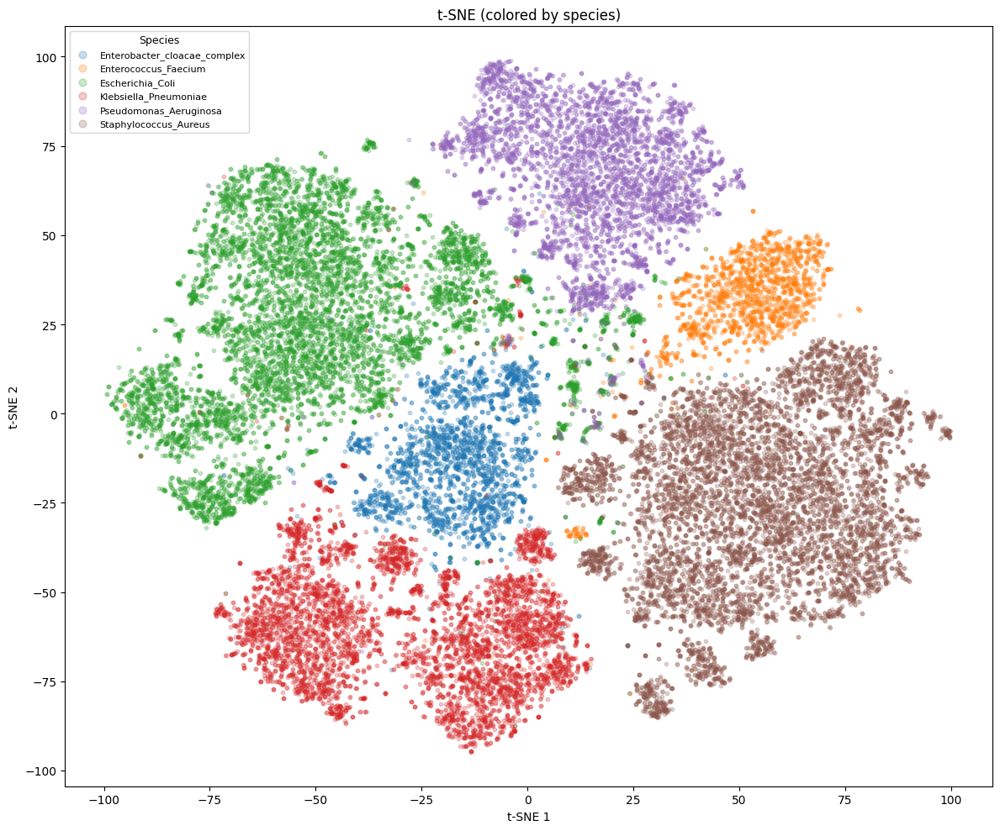


===== t-SNE: Global (colored by species) + misclassified points =====


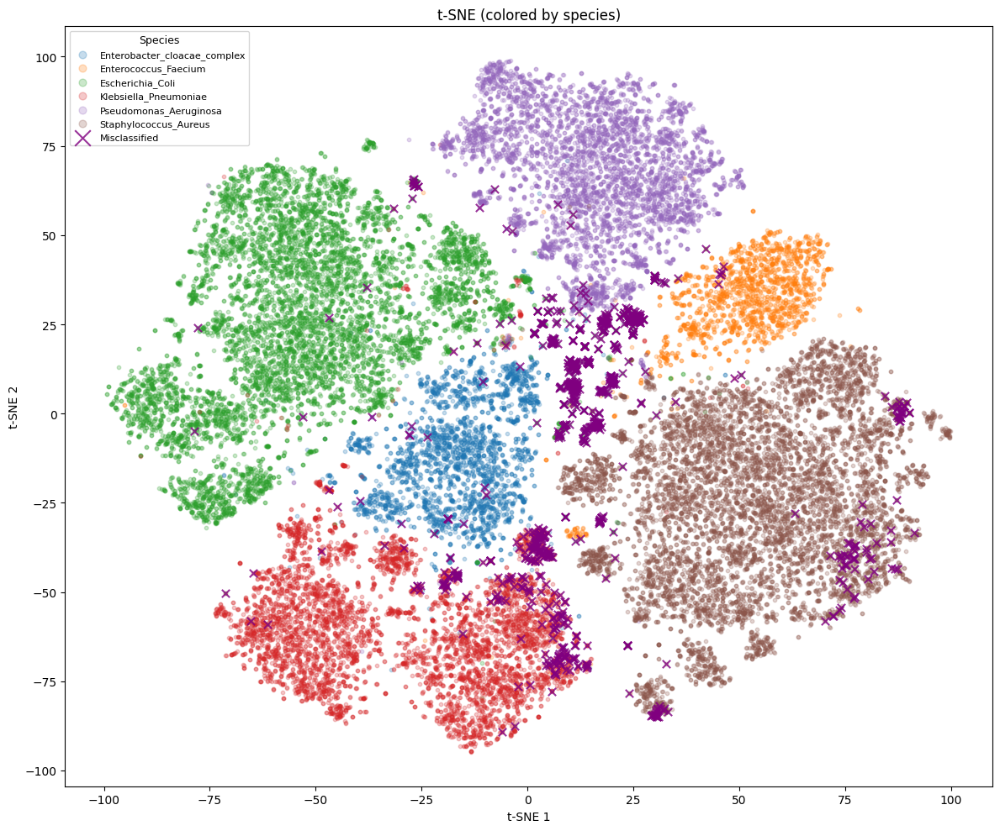


===== t-SNE: Per-species (colored by hospital) =====


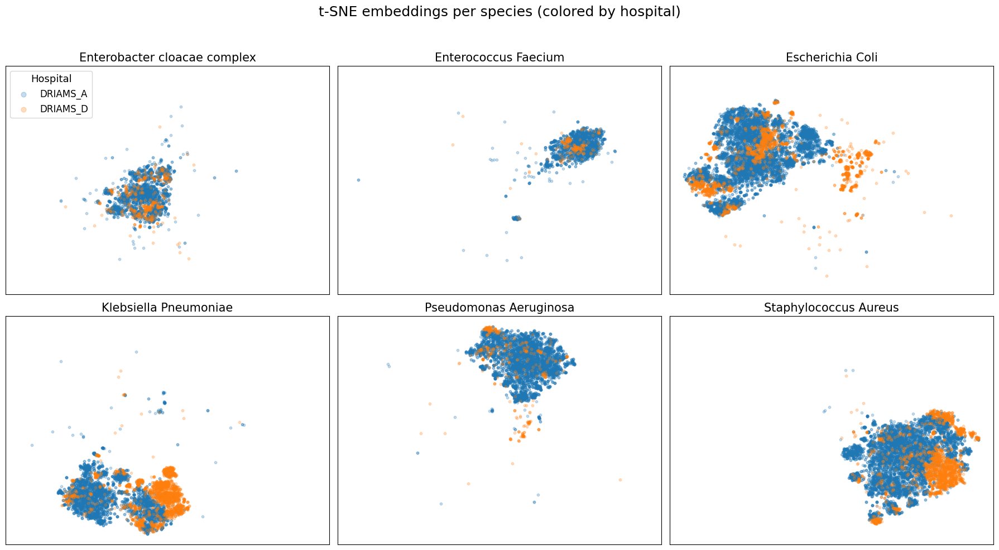


===== t-SNE: Per-species (colored by hospital) + misclassified points =====


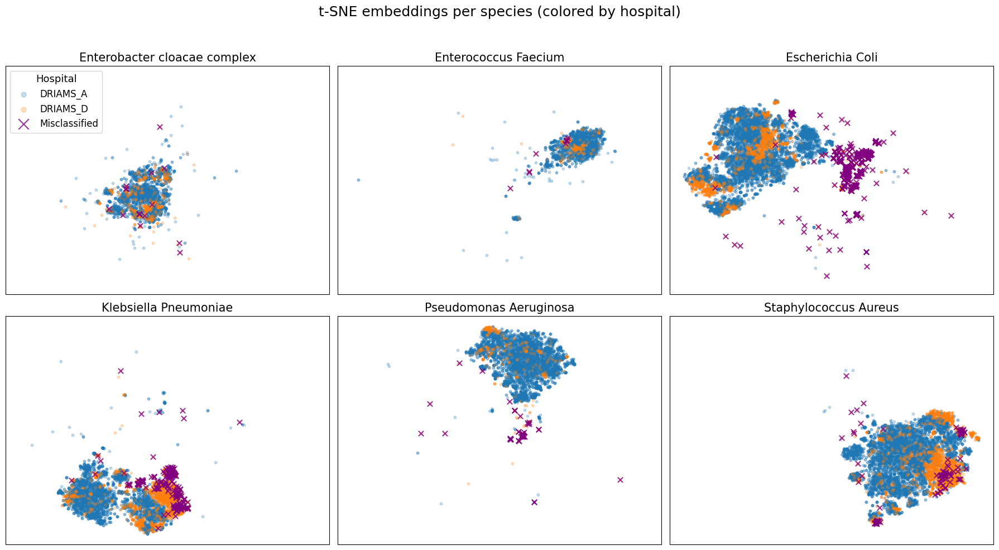


===== t-SNE: Per-species (overlay per hospital) + misclassified points =====


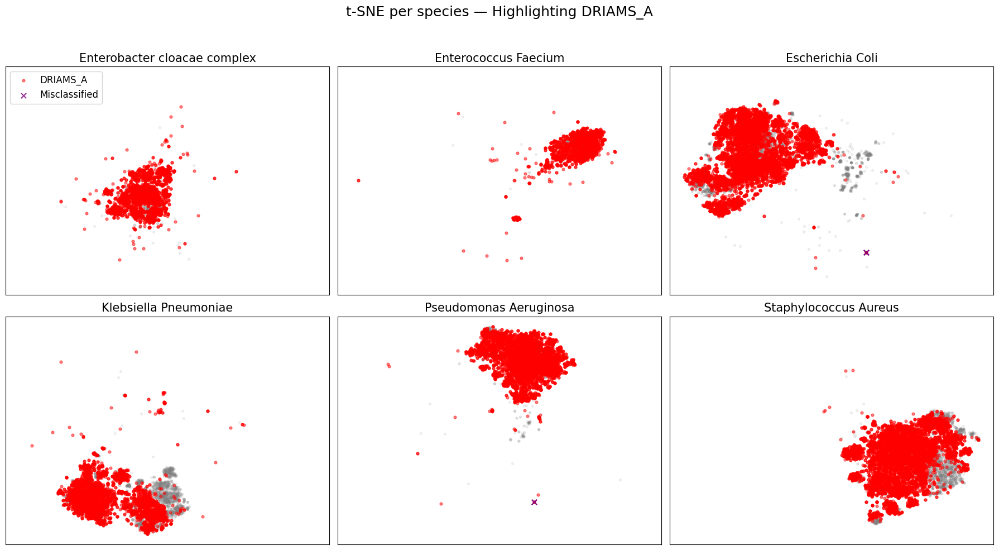

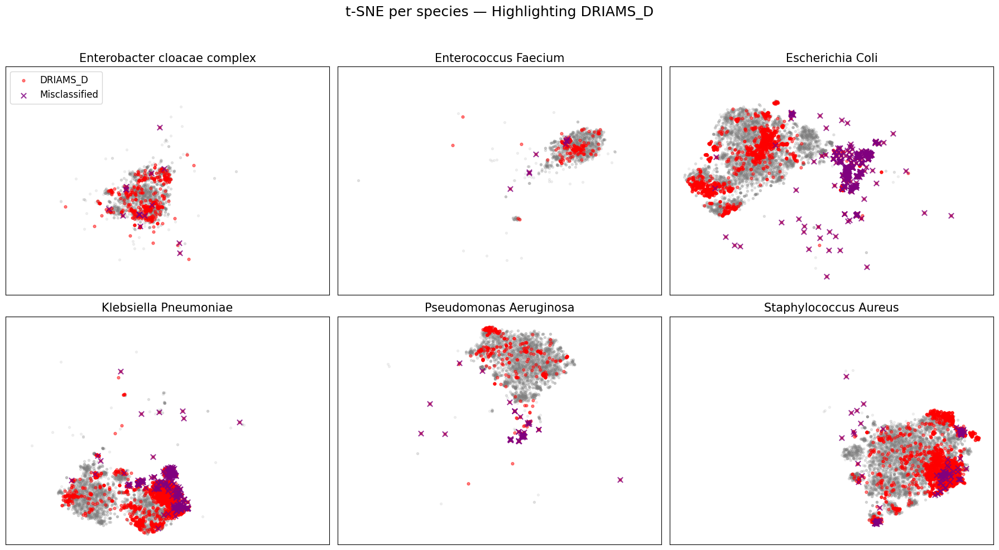


===== t-SNE: Per-species (overlay per year) =====


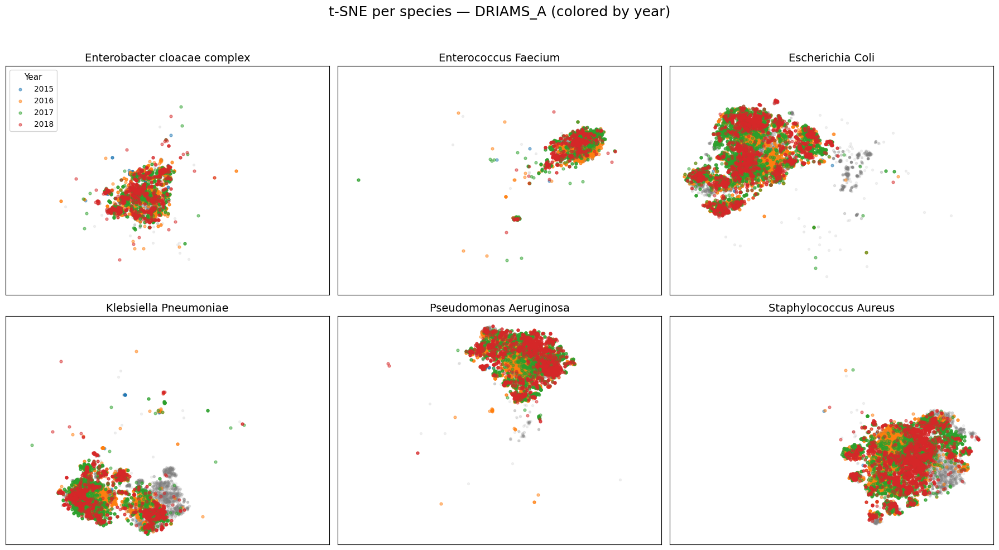

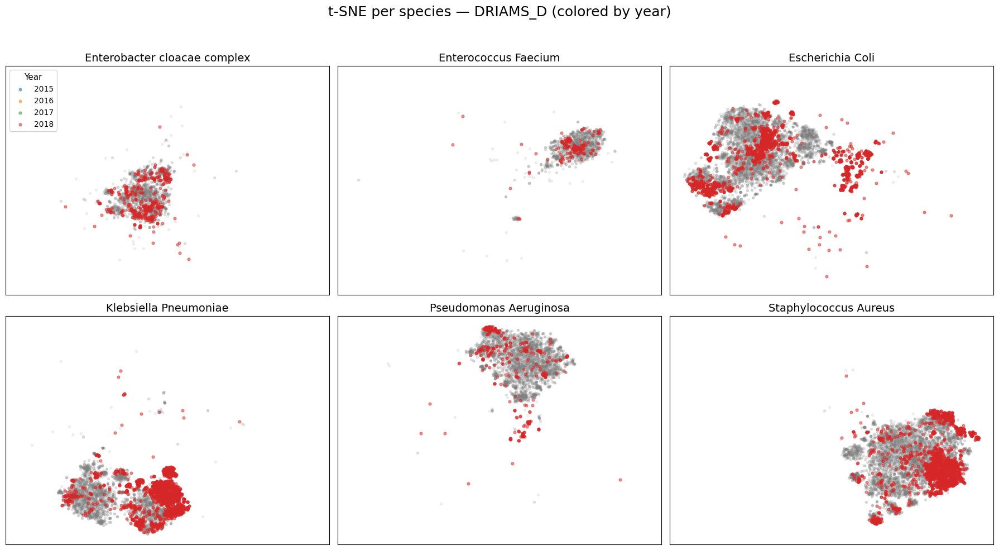


===== t-SNE: Per-species (overlay per year) + misclassified points =====


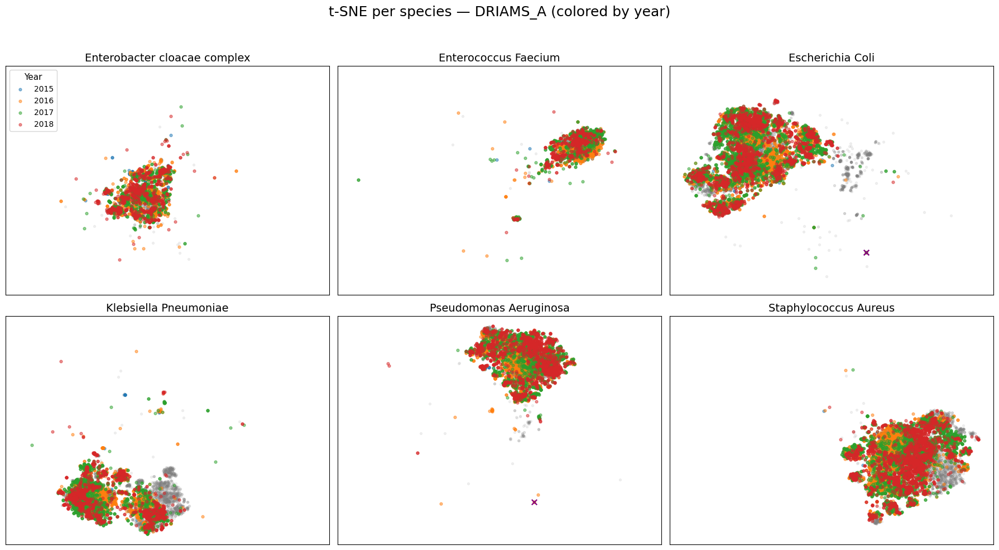

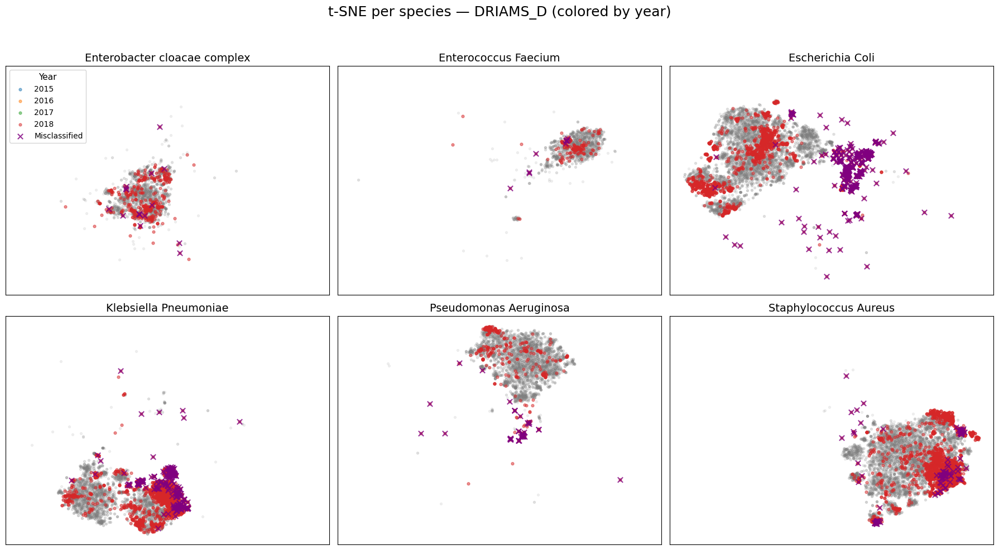

In [91]:
print("\n===== t-SNE: Global (colored by species) =====")
plot_tsne_global(tsne_multiweighted_df, per_species=False)

print("\n===== t-SNE: Global (colored by species) + misclassified points =====")
plot_tsne_global(tsne_multiweighted_df, per_species=False, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (colored by hospital) =====")
plot_tsne_global(tsne_multiweighted_df, per_species=True)

print("\n===== t-SNE: Per-species (colored by hospital) + misclassified points =====")
plot_tsne_global(tsne_multiweighted_df, per_species=True, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (overlay per hospital) + misclassified points =====")
plot_tsne_global(tsne_multiweighted_df, per_species=True, overlay_per_hospital=True, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (overlay per year) =====")
plot_tsne_global(tsne_multiweighted_df, per_species=True, overlay_per_year=True)

print("\n===== t-SNE: Per-species (overlay per year) + misclassified points =====")
plot_tsne_global(tsne_multiweighted_df, per_species=True, overlay_per_year=True, idx=mis_idx_all_global)

##### Per species

In [92]:
df_all, tsne_results = compute_tsne_per_species(Z_all, label_all, meta_all, prefix="f")


===== t-SNE (per species): colored by hospital =====


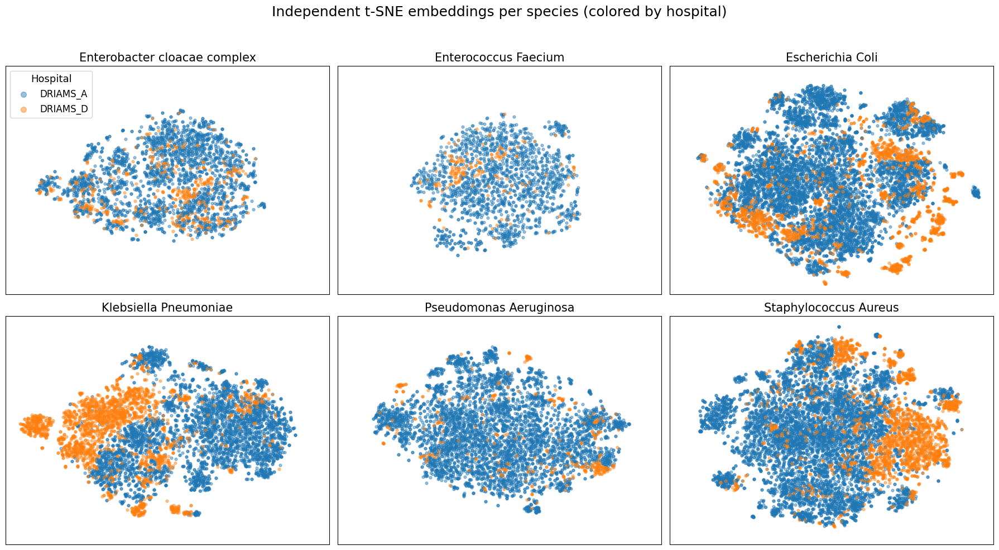


===== t-SNE (per species): colored by hospital + misclassified points =====


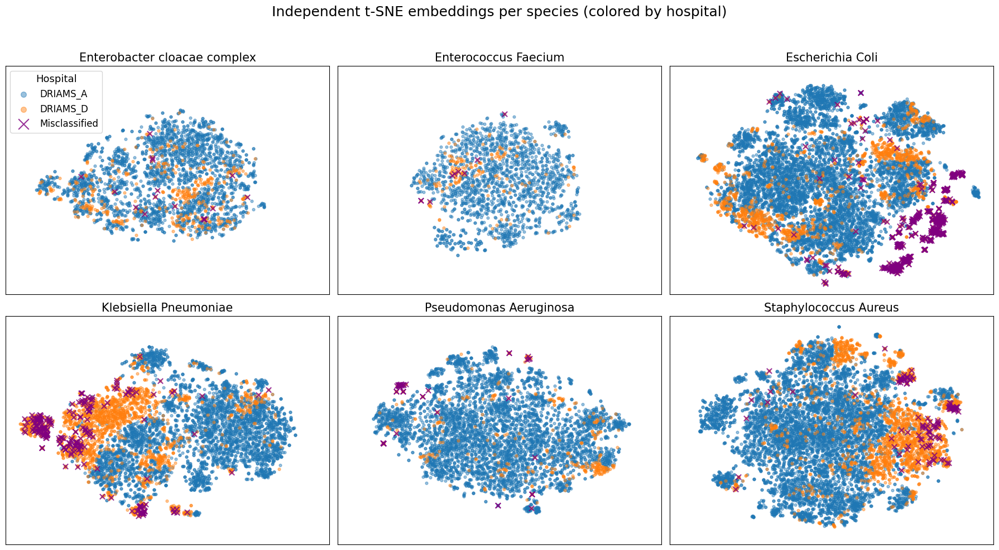


===== t-SNE (per species): overlay per hospital + misclassified points =====


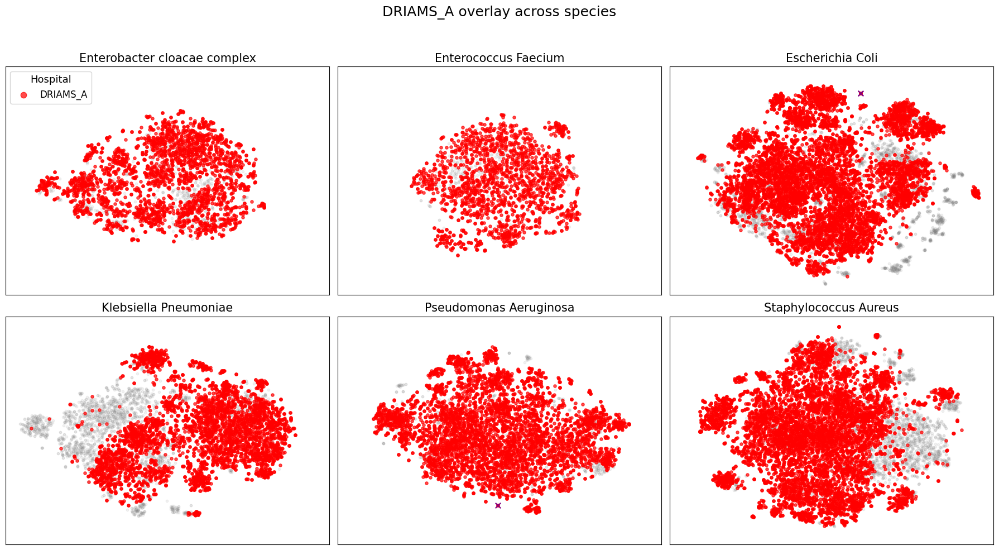

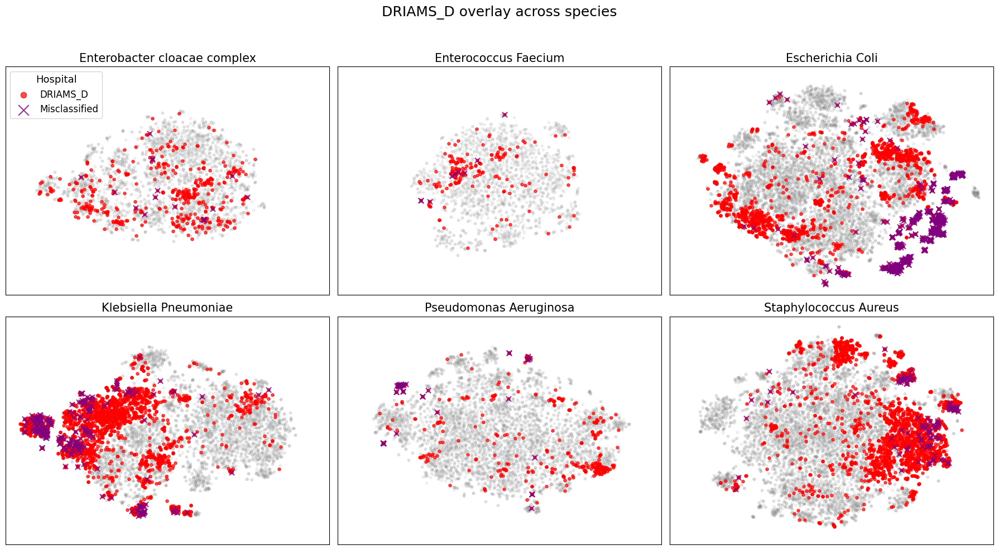


===== t-SNE (per species): overlay per year =====


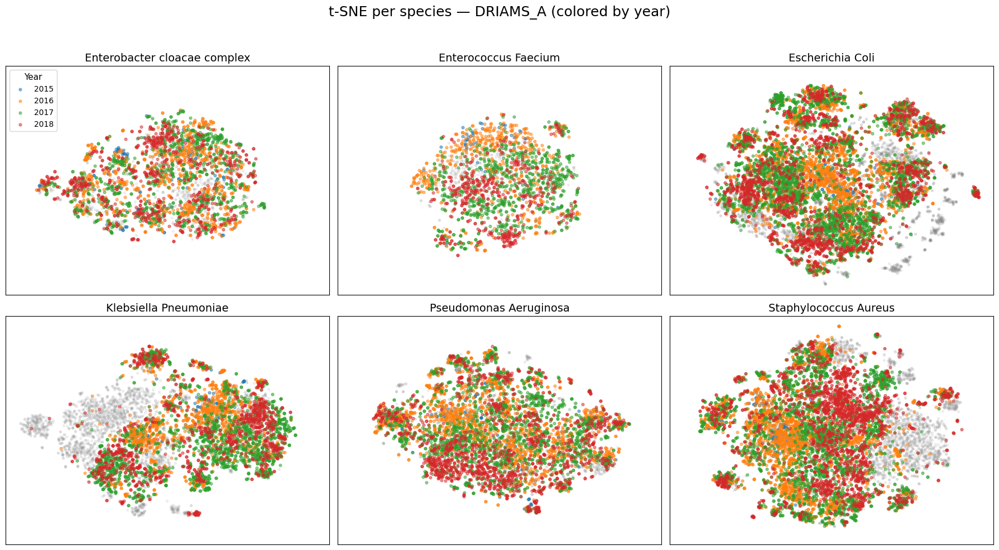

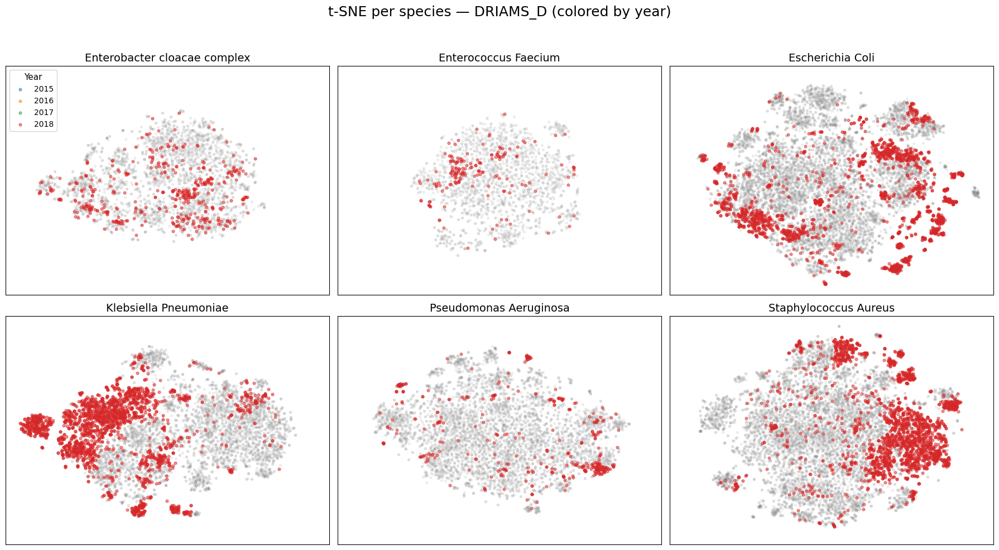


===== t-SNE (per species): overlay per year + misclassified points =====


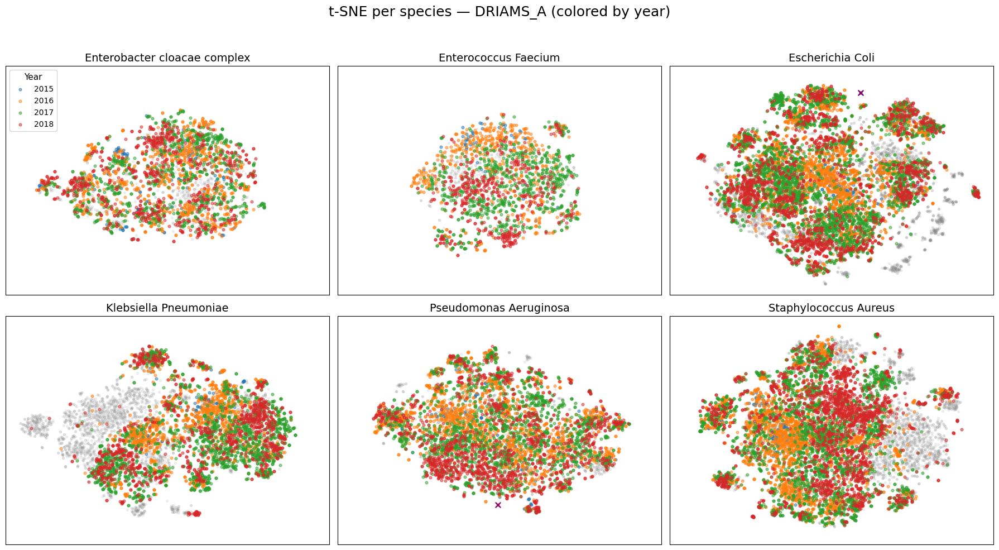

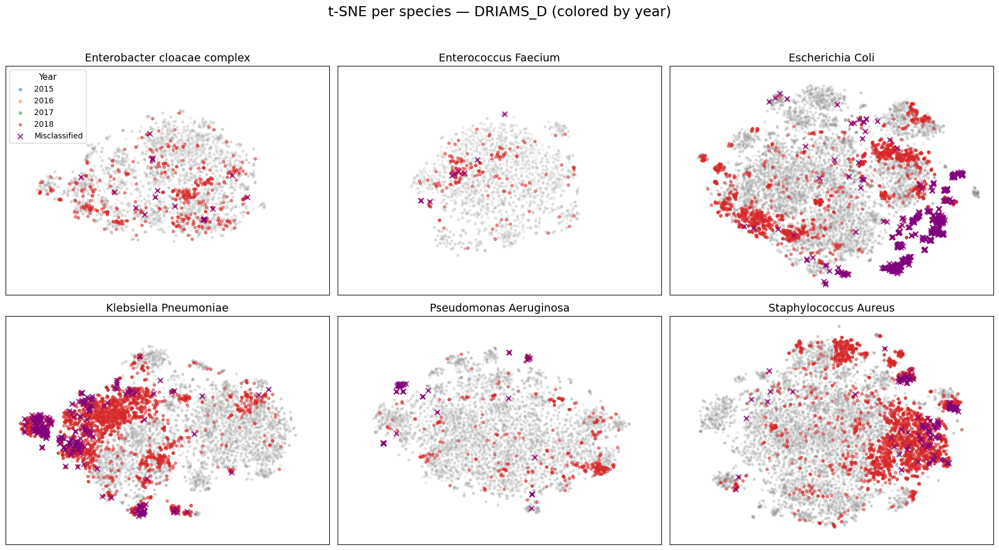

In [93]:
print("\n===== t-SNE (per species): colored by hospital =====")
plot_tsne_species(df_all, tsne_results, idx=None)

print("\n===== t-SNE (per species): colored by hospital + misclassified points =====")
plot_tsne_species(df_all, tsne_results, idx=mis_idx_all_global)

print("\n===== t-SNE (per species): overlay per hospital + misclassified points =====")
plot_tsne_species(df_all, tsne_results, overlay_per_hospital=True, idx=mis_idx_all_global)

print("\n===== t-SNE (per species): overlay per year =====")
plot_tsne_species(df_all, tsne_results, overlay_per_year_per_species=True)

print("\n===== t-SNE (per species): overlay per year + misclassified points =====")
plot_tsne_species(df_all, tsne_results, overlay_per_year_per_species=True, idx=mis_idx_all_global)